# Food Project v2 - Transfer Learning

## Summary

I applied transfer learning to build the **food/no-food classification CNN model**. The pretrained model I used was **Resnet50 v2**. I removed the final layer of Resnet50 and instead attached a block which consists of a GlobalAveragePooling layer with dropout, a fully connected layer with dropout, and one more fully connected layer that performs binary classification as output. 

During a lot of repetition of training, I noticed that the model seemed to start overfitting in very early stage. It reached to above 90% accuracy both training and validation at second epoch. I ended up with just 2 epochs with very low learning rate with Adam optimiser.

In test, the model performed perfect classification with food images(recall = 1.0), while false positive rate (no-food images classified as food) is around 0.19 with threshold 0.5. I found that food images are classified as food with very high probability (0.99-1.0) whereas no-food images are predicted with from 0.0(no-food) to 1.0(food) probability, even though the majority of no-food samples are predicted with under 0.5. Finally I set the threshold of this binary classification at 0.99, which marks the highest accuracy in this case (0.97). I couldn't find the cause of this skewness and didn't know how to deal with it. I would like to learn about it in the future.  

In [1]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Input, BatchNormalization, Activation
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential
from keras.models import Model, load_model
import numpy as np

from keras.applications.resnet_v2 import ResNet50V2

Using TensorFlow backend.


In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
# Try ResNet

img_input = Input(shape=(224, 224, 3))

#pretrained_model = ResNet50V2(include_top=False, input_tensor=img_input, weights='imagenet')
pretrained_model = load_model('ResNet50V2.h5')

for layer in pretrained_model.layers:
    layer.trainable = False

last_output = pretrained_model.layers[-1].output
print(last_output.shape)

#x = Flatten()(last_output)
x = GlobalAveragePooling2D()(last_output)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)

output = Dense(1, activation='sigmoid')(x)

model = Model(pretrained_model.input, output)

W1114 18:21:43.065680 140018330576704 deprecation_wrapper.py:119] From /home/chieko/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:66: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W1114 18:21:43.075013 140018330576704 deprecation_wrapper.py:119] From /home/chieko/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:541: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W1114 18:21:43.092278 140018330576704 deprecation_wrapper.py:119] From /home/chieko/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4432: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1114 18:21:43.102333 140018330576704 deprecation_wrapper.py:119] From /home/chieko/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4267: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W1114 1

(?, 7, 7, 2048)


In [4]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
____________________________________________________________________________________________

In [5]:
from keras.optimizers import Adam

model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.00005), metrics=['accuracy'])

W1114 18:21:48.472351 140018330576704 deprecation_wrapper.py:119] From /home/chieko/anaconda3/lib/python3.7/site-packages/keras/optimizers.py:793: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W1114 18:21:48.477997 140018330576704 deprecation.py:323] From /home/chieko/anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


## Load data

In [6]:
from keras.preprocessing.image import ImageDataGenerator
import os

batch_size = 64

train_dir = os.path.join(os.getcwd(), 'train')
valid_dir = os.path.join(os.getcwd(), 'valid')
test_dir = os.path.join(os.getcwd(), 'test')

num_samples_train = len(os.listdir(os.path.join(train_dir, 'food'))) + len(os.listdir(os.path.join(train_dir, 'no_food')))
num_samples_valid = len(os.listdir(os.path.join(valid_dir, 'food'))) + len(os.listdir(os.path.join(valid_dir, 'no_food')))
num_samples_test = len(os.listdir(os.path.join(test_dir, 'food'))) + len(os.listdir(os.path.join(test_dir, 'no_food')))

print("Train:{}  Valid:{}  Test:{}".format(num_samples_train, num_samples_valid, num_samples_test))

Train:8211  Valid:1028  Test:1026


In [7]:
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

classes = ['no_food', 'food']
seed = 46

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), classes=classes, batch_size=batch_size, class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(
    valid_dir, target_size=(224, 224), classes=classes, batch_size=batch_size, class_mode='binary')


Found 8211 images belonging to 2 classes.
Found 1028 images belonging to 2 classes.


## Training

In [8]:
from math import ceil
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

epochs=2

history = model.fit_generator(
    train_generator, steps_per_epoch=ceil(num_samples_train / batch_size), epochs=epochs, 
    validation_data=valid_generator, validation_steps=ceil(num_samples_valid / batch_size),
    verbose=1)

Epoch 1/2
129/129 [==============================] - 69s 533ms/step - loss: 0.3682 - acc: 0.8321 - val_loss: 0.3109 - val_acc: 0.8959
Epoch 2/2
129/129 [==============================] - 61s 473ms/step - loss: 0.1729 - acc: 0.9377 - val_loss: 0.2983 - val_acc: 0.9095


<Figure size 432x288 with 0 Axes>

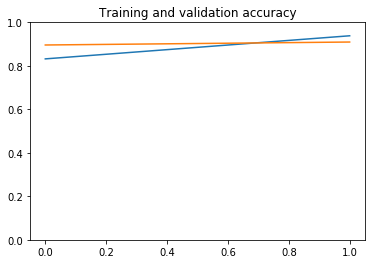

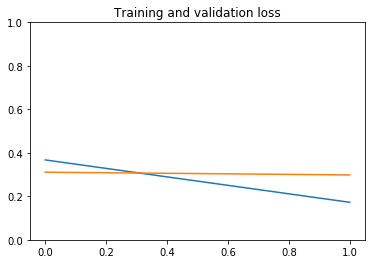

<Figure size 432x288 with 0 Axes>

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.close()

acc = history.history['acc']
val_acc = history.history['val_acc']


loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc)
plt.plot(epochs, val_acc,)
plt.title("Training and validation accuracy")
plt.ylim((0, 1.0))

plt.figure()

plt.plot(epochs, loss)
plt.plot(epochs, val_loss,)
plt.title("Training and validation loss")
plt.ylim((0, 1.0))

plt.figure()

In [10]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir, target_size=(224, 224), batch_size=1, classes=classes, shuffle=False, class_mode='binary')
#    test_dir, target_size=(224, 224), classes=classes, batch_size=1, shuffle=False, class_mode='binary')

ret_eval = model.evaluate_generator(test_generator, verbose=1)

print("loss = {}".format(ret_eval[0]))
print("accuracy = {}".format(ret_eval[1]))

Found 1026 images belonging to 2 classes.
1026/1026 [==============================] - 21s 20ms/step
loss = 0.33658883230032793
accuracy = 0.9074074074074074


## Analyse the result of prediction

In [11]:
test_generator.reset()

# predict test data
pred = model.predict_generator(test_generator, verbose=1)
pred_images = test_generator.filenames

# Make Tuple of (filename, prediction)
image_name = np.array(pred_images)
image_pred = np.concatenate((image_name.reshape(len(pred), 1), pred), axis=1)
print(image_pred.shape)



1026/1026 [==============================] - 21s 20ms/step
(1026, 2)


In [12]:
# Prediction accuracy
thr = 0.5

# True label : food = 1, no_food = 0
label = np.where(np.char.startswith(image_pred[:, 0], "no_food"), 0, 1)

pred_label = np.where(image_pred[:, 1].astype(float) > thr, 1, 0)

all_num = label.shape[0]
label_food_num = np.sum(label)
label_nofood_num = all_num - label_food_num

pred_food_num = np.sum(pred_label)
pred_nofood_num = all_num - pred_food_num

# True Positive
true_food_num = np.sum(np.where(pred_label[label == 1] == 1, 1, 0))
# False Negative
false_nofood_num = label_food_num - true_food_num

# True Negative
true_nofood_num = np.sum(np.where(pred_label[label == 0] == 0, 1, 0))
# False Positive
false_food_num = label_nofood_num - true_nofood_num

print("*** Predicted/True Label ***")
print("   Food/Food :   {:4d}   No Food/Food :   {:4d}   ALL Food:   {:4d}".format(true_food_num, false_nofood_num, label_food_num))
print("   Food/No Food :{:4d}   No Food/No Food :{:4d}   ALL No Food:{:4d}".format(false_food_num, true_nofood_num, label_nofood_num))

print("\nAccuracy = {}".format((true_food_num + true_nofood_num) / all_num))

*** Predicted/True Label ***
   Food/Food :    520   No Food/Food :      0   ALL Food:    520
   Food/No Food :  95   No Food/No Food : 411   ALL No Food: 506

Accuracy = 0.9074074074074074


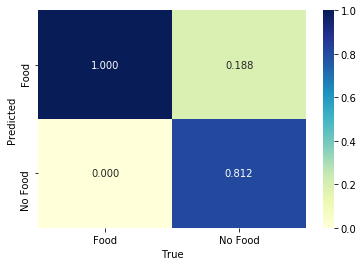

In [13]:
import seaborn as sns 

conf_matrix = np.array([[true_food_num, false_food_num], # Pred label == food
                        [false_nofood_num, true_nofood_num] # Pred label == No food
                       ], dtype=np.float32)

# Normalise by the number of true label
conf_matrix[:, 0] = conf_matrix[:, 0]/label_food_num
conf_matrix[:, 1] = conf_matrix[:, 1]/label_nofood_num

ticks = ["Food", "No Food"]

ax = plt.axes()
ax = sns.heatmap(conf_matrix, cmap="YlGnBu", fmt=".3f", annot = True, xticklabels=ticks, yticklabels=ticks, ax = ax)
ax.set(xlabel='True', ylabel='Predicted')

plt.show()


## Show test images and prediction

In [14]:
# Shuffle test data
#np.random.shuffle(image_pred)
rand_indices = np.random.choice(np.arange(image_pred.shape[0]), 20, replace=False)

image_pred_chosen = image_pred[rand_indices]

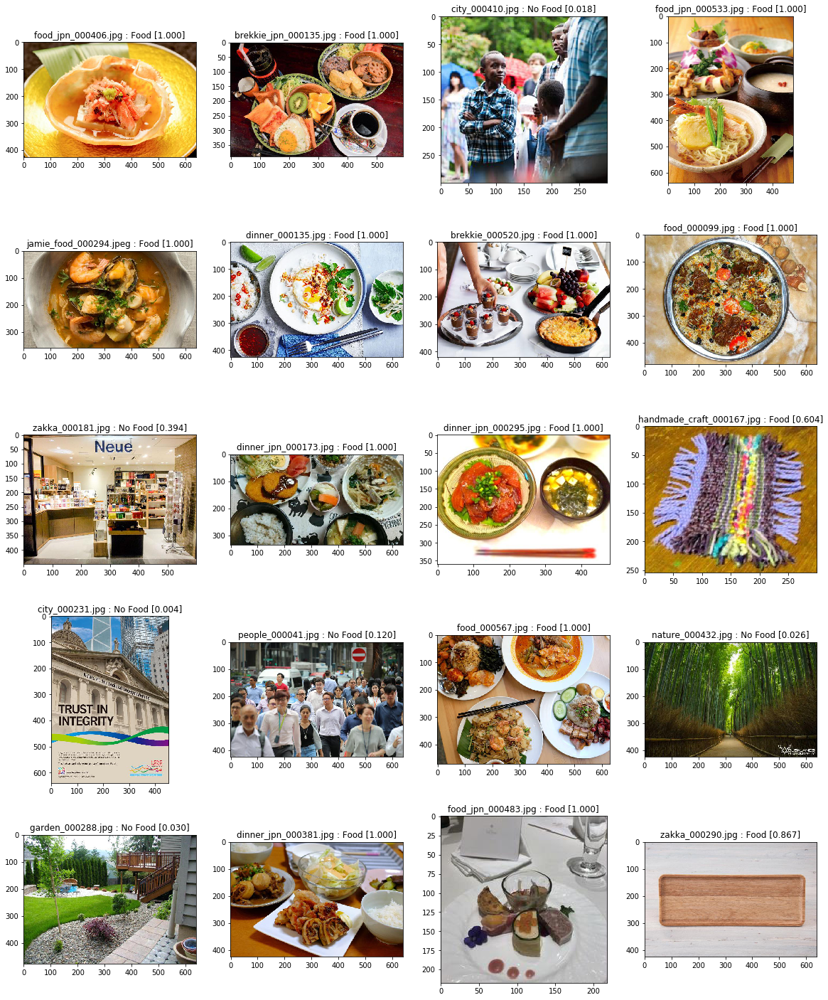

In [15]:
import matplotlib.image as mpimg

# Show random 20 test images and their prediction
rows, cols = 5, 4
f, ax = plt.subplots(rows, cols, figsize=(20, 25))

for i, prediction in enumerate(image_pred_chosen):
    (name, prob) = prediction
    result = "Food" if float(prob) > thr else "No Food"
    img = mpimg.imread(os.path.join(test_dir, name))
    ax[i // cols, i % cols].imshow(img)
    ax[i // cols, i % cols].set_title("{} : {} [{:.3f}]".format(os.path.basename(name), result, float(prob)))
    #print("{} : {}".format(name, prob))

plt.show()

## Examples of errors

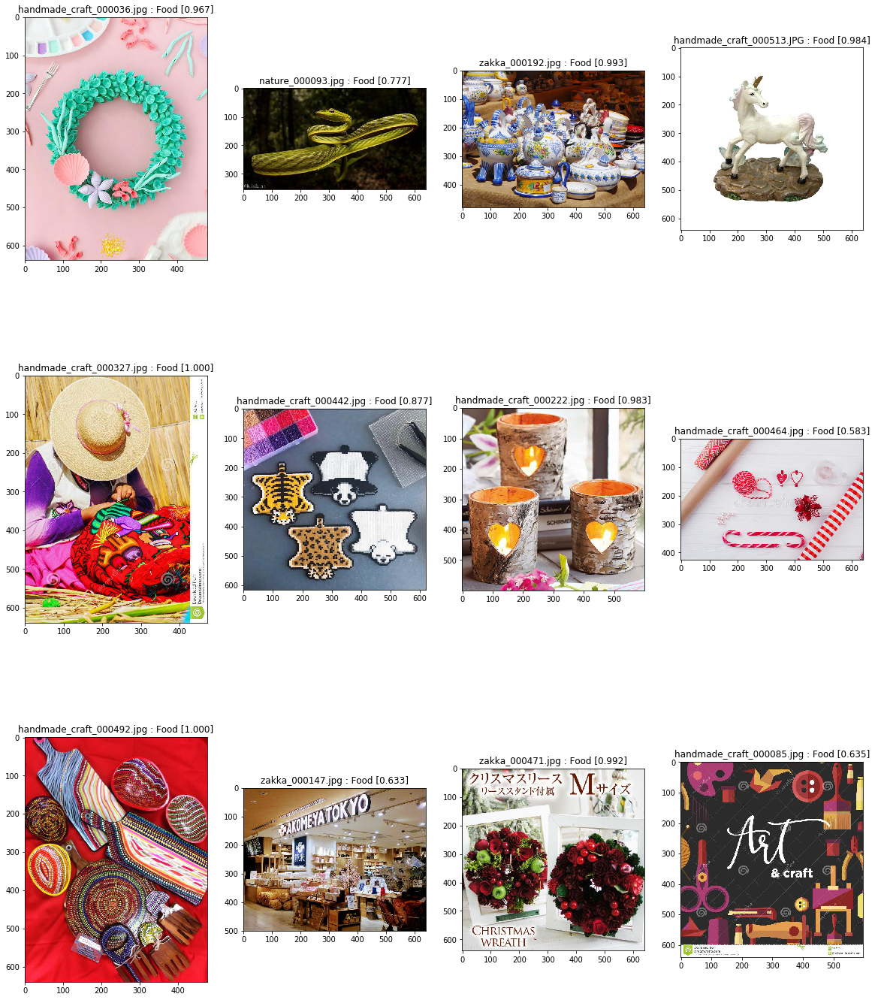

In [16]:
# Get random example from error images (predicted as food with true label as no food)
error_list = np.where(pred_label[label == 0] == 1, 1, 0)

error_indices = np.squeeze(np.nonzero(error_list))

rand_error_indices = np.random.choice(error_indices, 12, replace=False)
image_errors = image_pred[rand_error_indices]

rows2, cols2 = 3, 4

f2, ax2 = plt.subplots(rows2, cols2, figsize=(20, 25))

for i, err in enumerate(image_errors):
    (name, prob) = err
    result = "Food" if float(prob) > thr else "No Food"
    img = mpimg.imread(os.path.join(test_dir, name))
    ax2[i // cols2, i % cols2].imshow(img)
    ax2[i // cols2, i % cols2].set_title("{} : {} [{:.3f}]".format(os.path.basename(name), result, float(prob)))
    #print("{} : {}".format(name, prob))

plt.show()

# Adjust threshold

In [17]:
def change_thresholds(thresholds):

    # True Positive Rate & False Positive Rate
    TPR = []
    FPR = []

    for th in thresholds:

        pred_label = np.where(image_pred[:, 1].astype(float) > th, 1, 0)

        pred_food_num = np.sum(pred_label)
        pred_nofood_num = all_num - pred_food_num

        # True Positive
        true_food_num = np.sum(np.where(pred_label[label == 1] == 1, 1, 0))
        # False Negative
        false_nofood_num = label_food_num - true_food_num

        # True Negative
        true_nofood_num = np.sum(np.where(pred_label[label == 0] == 0, 1, 0))
        # False Positive
        false_food_num = label_nofood_num - true_nofood_num

        TPR.append(true_food_num/label_food_num)
        FPR.append(false_food_num/label_nofood_num)

        print("\n* Threshold [{:.3f}]".format(th))
        print("    F/F : {}   NF/F : {}   F/NF : {}   NF/NF : {}".format(true_food_num, false_nofood_num, 
                                                                                     false_food_num, true_nofood_num))
        print("    Accuracy = {}".format((true_food_num + true_nofood_num) / all_num))
        

    return (TPR, FPR)

In [18]:
thresholds = np.arange(0, 1.0, 0.05)[::-1]
(tpr, fpr) = change_thresholds(thresholds)


* Threshold [0.950]
    F/F : 518   NF/F : 2   F/NF : 37   NF/NF : 469
    Accuracy = 0.9619883040935673

* Threshold [0.900]
    F/F : 518   NF/F : 2   F/NF : 44   NF/NF : 462
    Accuracy = 0.9551656920077972

* Threshold [0.850]
    F/F : 520   NF/F : 0   F/NF : 54   NF/NF : 452
    Accuracy = 0.9473684210526315

* Threshold [0.800]
    F/F : 520   NF/F : 0   F/NF : 57   NF/NF : 449
    Accuracy = 0.9444444444444444

* Threshold [0.750]
    F/F : 520   NF/F : 0   F/NF : 61   NF/NF : 445
    Accuracy = 0.9405458089668616

* Threshold [0.700]
    F/F : 520   NF/F : 0   F/NF : 70   NF/NF : 436
    Accuracy = 0.9317738791423001

* Threshold [0.650]
    F/F : 520   NF/F : 0   F/NF : 77   NF/NF : 429
    Accuracy = 0.9249512670565302

* Threshold [0.600]
    F/F : 520   NF/F : 0   F/NF : 81   NF/NF : 425
    Accuracy = 0.9210526315789473

* Threshold [0.550]
    F/F : 520   NF/F : 0   F/NF : 90   NF/NF : 416
    Accuracy = 0.9122807017543859

* Threshold [0.500]
    F/F : 520   NF/F : 0 

## See more about Threshold > 0.95

In [19]:
thresholds_095 = thresholds = np.arange(0.95, 1.0, 0.002)[::-1]
_, _ = change_thresholds(thresholds_095)


* Threshold [1.000]
    F/F : 0   NF/F : 520   F/NF : 0   NF/NF : 506
    Accuracy = 0.49317738791423

* Threshold [0.998]
    F/F : 496   NF/F : 24   F/NF : 16   NF/NF : 490
    Accuracy = 0.9610136452241715

* Threshold [0.996]
    F/F : 501   NF/F : 19   F/NF : 17   NF/NF : 489
    Accuracy = 0.9649122807017544

* Threshold [0.994]
    F/F : 505   NF/F : 15   F/NF : 19   NF/NF : 487
    Accuracy = 0.9668615984405458

* Threshold [0.992]
    F/F : 509   NF/F : 11   F/NF : 21   NF/NF : 485
    Accuracy = 0.9688109161793372

* Threshold [0.990]
    F/F : 511   NF/F : 9   F/NF : 21   NF/NF : 485
    Accuracy = 0.9707602339181286

* Threshold [0.988]
    F/F : 511   NF/F : 9   F/NF : 21   NF/NF : 485
    Accuracy = 0.9707602339181286

* Threshold [0.986]
    F/F : 512   NF/F : 8   F/NF : 23   NF/NF : 483
    Accuracy = 0.969785575048733

* Threshold [0.984]
    F/F : 513   NF/F : 7   F/NF : 24   NF/NF : 482
    Accuracy = 0.969785575048733

* Threshold [0.982]
    F/F : 513   NF/F : 7  

In [20]:
_, _ = change_thresholds([0.999])


* Threshold [0.999]
    F/F : 480   NF/F : 40   F/NF : 10   NF/NF : 496
    Accuracy = 0.9512670565302144


## Discussion

Threshold with the highest accuracy is **around 0.990**.

However, if I don't want to miss any food photo (even if I end up to pick up some no-food photos as food photo by mistake), threshold should be set at around 0.8. 

If I really want to detect ONLY food photos, I need to increase the threshold as much as possible. However, some no-food images in test data were predicted as FOOD with 1.0 probability. So there is no threshold to completely get rid of no-food photos from the food photo classification.

In [21]:
new_thr = 0.99


* Threshold [0.990]
    F/F : 511   NF/F : 9   F/NF : 21   NF/NF : 485
    Accuracy = 0.9707602339181286


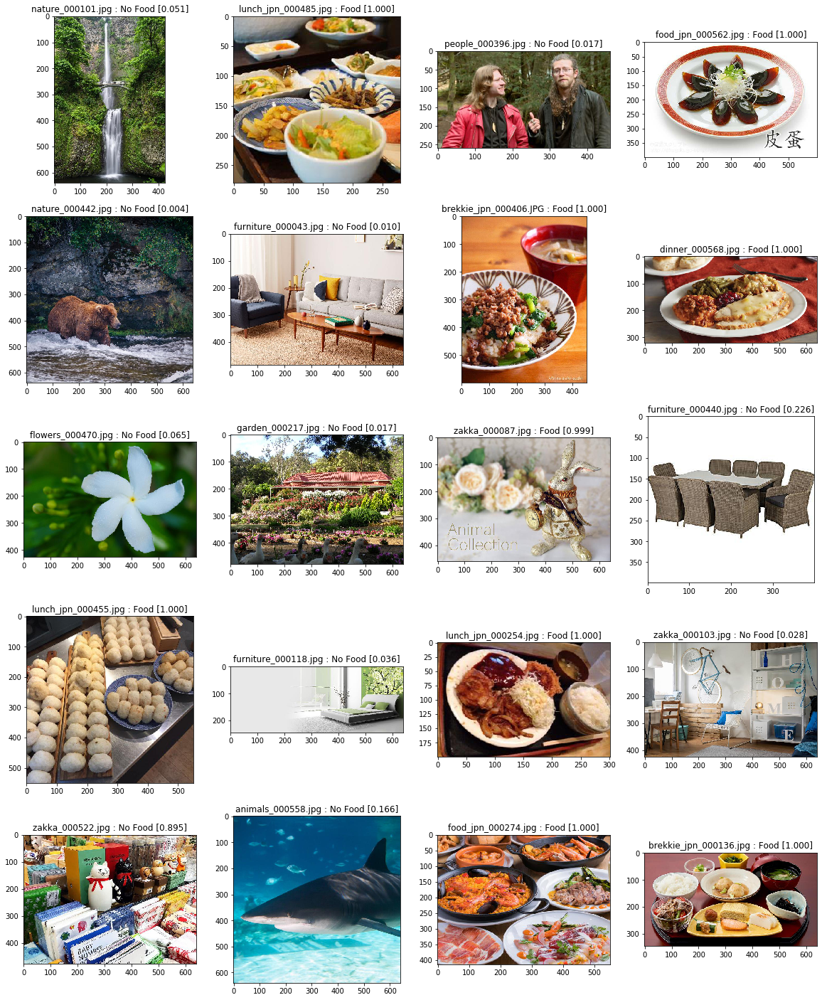

In [22]:
_, _ = change_thresholds([new_thr])


# Shuffle test data
#np.random.shuffle(image_pred)
rand_indices = np.random.choice(np.arange(image_pred.shape[0]), 20)

image_pred_chosen = image_pred[rand_indices]

# Show random 20 test images and their prediction
rows, cols = 5, 4
f, ax = plt.subplots(rows, cols, figsize=(20, 25))

for i, prediction in enumerate(image_pred_chosen):
    (name, prob) = prediction
    result = "Food" if float(prob) > new_thr else "No Food"
    img = mpimg.imread(os.path.join(test_dir, name))
    ax[i // cols, i % cols].imshow(img)
    ax[i // cols, i % cols].set_title("{} : {} [{:.3f}]".format(os.path.basename(name), result, float(prob)))
    #print("{} : {}".format(name, prob))

plt.show()

### Example of errors

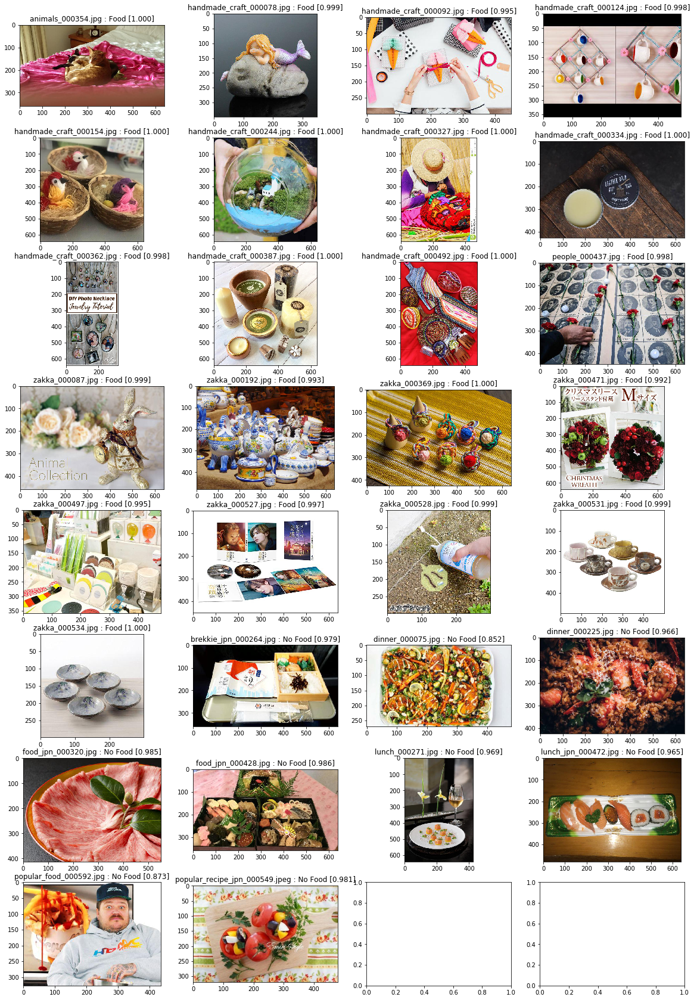

In [23]:
# Get error images
pred_label_new = np.where(image_pred[:, 1].astype(float) > new_thr, 1, 0)

bool_errors = np.logical_xor(pred_label_new, label)

error_indices_new = np.squeeze(np.nonzero(bool_errors.astype(int)))

image_errors = image_pred[error_indices_new]

err_cols = 4
err_rows = ceil(len(image_errors) / err_cols)


err_f, err_ax = plt.subplots(err_rows, err_cols, figsize=(20, 30))

for i, err in enumerate(image_errors):
    (name, prob) = err
    result = "Food" if float(prob) > new_thr else "No Food"
    img = mpimg.imread(os.path.join(test_dir, name))
    err_ax[i // err_cols, i % err_cols].imshow(img)
    err_ax[i // err_cols, i % err_cols].set_title("{} : {} [{:.3f}]".format(os.path.basename(name), result, float(prob)))
    #print("{} : {}".format(name, prob))

plt.show()

## Save the model

In [24]:
from datetime import date, time, datetime
import time

#datetimestr = datetime.now().__str__()
#timestamp = datetimestr.split()[0] + "_" + datetimestr.split()[1].split('.')[0]

epoch_time = int(time.time())

model_filename = "food_model_resnet_" + str(epoch_time) + ".h5"

model.save(model_filename)
print("Trained model was saved into {}.".format(model_filename))

# To use this model again, load the model by doing as following:
# model = load_model('food_model_resnet.h5')

Trained model was saved into food_model_resnet_1573727092.h5.
